
# 1. Introducción

Este informe presenta las etapas desarrolladas durante la construcción del modelo con el que se obtuvo el mejor resultado en el concurso. El objetivo es predecir la funcionalidad de puntos de agua en Tanzania a partir de variables geográficas, técnicas y socioeconómicas.

---

# 2. Carga y exploración inicial de datos

Se cargaron los datos y se realizó una primera exploración para identificar tipos de variables, valores nulos y posibles inconsistencias.

---

# 3. Preprocesamiento y limpieza de variables

## 3.1 Eliminación de columnas

- `ward`, `subvillage` y `region_code` fueron eliminadas por contener demasiados valores únicos o inconsistencias que no aportaban valor predictivo.
- `num_private` también fue eliminada debido a que tenía valores constantes o nulos en casi todo el dataset.
- `wpt_name` fue eliminado porque corresponde al nombre del punto de agua y no aporta valor al análisis.
- `subvillage` fue eliminado porque contiene muchos valores únicos.

## 3.2 Agrupación y simplificación de variables categóricas

- `funder`: Se agruparon los financiadores más frecuentes (`Government Of Tanzania`, `Danida`, etc.) y el resto se codificó como `'other'` o `'unknown'`.
- `installer`: Se normalizó a minúsculas y se unificaron categorías similares (`gov`, `gover`, `government`) para reducir cardinalidad.
- `scheme_management`: Se simplificó en categorías como `vwc`, `wug`, `water authority`, etc., agrupando el resto como `'other'`.
- `lga` y `region`: Se agruparon en categorías significativas y se etiquetaron las menos frecuentes como `'other'`.
- `payment` y `payment_type`: Se conservó `payment_type` por ser más clara y reducir duplicación de información.
- `source` y `source_type`: Se conservó `source_type` al ser más resumida y representativa.
- `water_quality` y `quality_group`: Se conservó `quality_group` por su agrupación lógica.
- `waterpoint_type` y `waterpoint_type_group`: Se conservó `waterpoint_type_group` por ser más estructurada.
- `extraction_type_group`, `extraction_type`, `extraction_type_classse`: Se conservó la variable `extraction_type`, ya que contiene un mayor número de categorías.
- `management`, `management_group`: Se decidió conservar `management_group` porque ofrece una clasificación más simple y organizada de los distintos tipos de gestión.
- `quantity`, `quantity_group`: Se consevó ´quantity_group´, las dos variables contienen misma información.

## 3.3 Tratamiento de valores nulos

- `public_meeting` y `permit`: Se imputaron con `'unknown'`.
- `gps_height`: Se reemplazaron los valores negativos por `NaN` y se imputaron con la mediana por región.
- En variables categóricas con alta dispersión, tanto los valores poco frecuentes como los valores nulos fueron agrupados bajo la categoría `'other'`.

## 3.4 Experimentos de imputación y tratamiento alternativo de valores faltantes

- Además de las transformaciones anteriores, se realizaron varios experimentos de imputación para mejorar la calidad del dataset y reducir el impacto de valores ausentes o erróneos:
    - **`construction_year`**: Se imputó con la **media según `extraction_type_group`**, suponiendo que el tipo de extracción guarda relación con la antigüedad del pozo.

    - **`longitude`**: Los valores cero se reemplazaron por `NaN` y se imputaron con la **media por región**.

    - **`permit`**: se imputó con la **moda** de la columna.
 
    - **`public_meeting`**: Se imputaron los valores nulos asignándoles el valor True por defecto.

    - **`population`**: Se aplicó una **imputación jerárquica**, primero por `region`, luego por `lga`, después por `ward` y finalmente con la media general.

    - **`date_recorded`** y **`operated_year`**:
      - `date_recorded` se transformó a formato `datetime`.
      - Se creó la variable **`operated_year`**, calculando los años de funcionamiento del pozo (`date_recorded` − `construction_year`).

    - Se probaron imputaciones simples (media, moda) y técnicas de winsorización para reducir el impacto de valores extremos.
- Sin embargo, los modelos entrenados con estos métodos obtuvieron resultados inferiores en modelos. Por ello, se optó por estrategias más robustas o simplemente transformar los valores a la categoría 'other'.
---

# 4. Transformación de variables numéricas

Se aplicaron distintas transformaciones a variables numéricas con el objetivo de facilitar su interpretación, reducir la dispersión y mejorar la calidad del modelo:

- **`amount_tsh`**: Se creó la variable `tsh_group` con rangos: `'0'`, `'1–500'`, `'500–2000'`, `'2000–10000'`, `'10000+'`.
- **`gps_height`**:  Se dividió la altitud en rangos como `'0'`, `'0–500'`, `'500–1000'`, `'1000–1500'`, `'1500–2000'`, `'2000–3000'` y `'3000+'`.
- **`population`**:  Se transformó la variable dividiendo la población estimada en los siguientes rangos: '0', '1–50', '51–200', '201–1000', '1001–5000', '5000+'
- **`district_code`**: Se convirtió a string y se agruparon los valores infrecuentes bajo la etiqueta `'other'`.
- **`num_private`**: Fue eliminada ya que contenía mayoritariamente ceros y no aportaba información útil al análisis.
-  **`construction_year`**: Se transformó la variable en una columna categórica con las siguientes etiquetas: '60s', '70s', '80s', '90s', '00s', '10s' y 'unknown'.



---

# 5. Feature Engineering 

En esta etapa se transformaron las variables categóricas en formato numérico mediante técnicas de codificación, específicamente **Label Encoding**. Esta técnica asigna un valor numérico único a cada categoría dentro de una variable, lo que permite que los modelos puedan trabajar con datos originalmente en formato de texto.


---

# 6. Modelado

- El modelo principal seleccionado fue **RandomForestClassifier**.
- Se empleó validación cruzada mediante **`StratifiedKFold`** para asegurar una distribución equilibrada de clases en cada pliegue.
- Se utilizó **`GridSearchCV`** para ajustar los hiperparámetros, obteniendo la mejor combinación con:
  - `max_depth = 20`
  - `min_samples_leaf = 1`
  - `min_samples_split = 5`
  - `n_estimators = 200`
- Se realizaron experimentos con distintos modelos: **RandomForestClassifier**, **LogisticRegression**, **DecisionTreeClassifier** y **XGBClassifier**. Entre ellos, **RandomForestClassifier obtuvo el mejor desempeño**, alcanzando una **precisión (accuracy) del 0.80**.
- Se utilizó **`feature_importances_`** para identificar las características más relevantes y realizar una selección de variables más eficiente.

---

# 7. Resultados

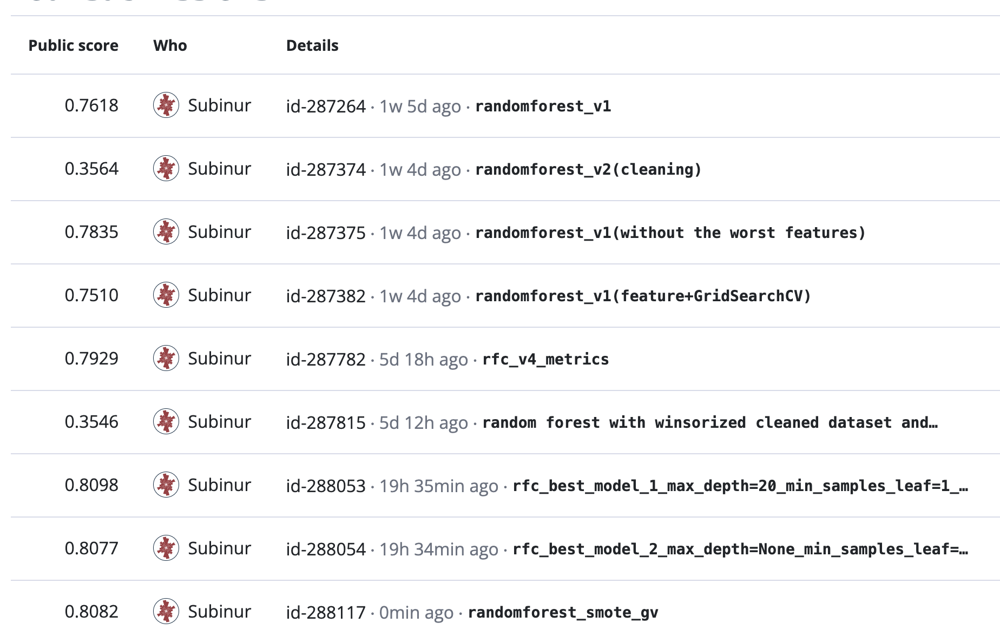
- **Mejor score obtenido:** `0.8098`
---

# 8. Conclusiones

- Las variables más influyentes en la predicción del estado del pozo fueron: `longitude`, `latitude`, `quantity`, `waterpoint_type_group`, `extraction_type`, `construction_decade`, `payment_type` y `tsh_group`.
- Se alcanzaron buenos resultados utilizando un modelo robusto como **RandomForestClassifier**, combinado con un preprocesamiento relativamente sencillo.
- El uso de SMOTE combinado con el modelo RandomForestClassifier (ajustado con los mejores hiperparámetros) permitió obtener un buen rendimiento general en la clasificación. Sin embargo, los resultados fueron ligeramente inferiores en comparación con el modelo entrenado sin aplicar SMOTE, lo que sugiere que, **en este caso, el modelo original fue capaz de manejar adecuadamente el desbalance de clases sin necesidad de sobremuestreo artificial**.
- Sorprendentemente, una limpieza más exhaustiva del conjunto de datos (como winsorización o imputación por categoría) **no aportó mejoras significativas al rendimiento del modelo**, lo que sugiere que una estrategia de preprocesamiento más simple puede ser suficiente en este caso.
- La selección cuidadosa de características y el ajuste de hiperparámetros contribuyeron a mejorar el rendimiento del modelo.

---

# 9. Business Insight


- **La ubicación geográfica** (`longitude` y `latitude`) es el principal factor predictivo del estado de las bombas de agua. Esto indica que ciertas regiones presentan un mayor riesgo de fallo, probablemente debido a factores ambientales adversos, falta de acceso a mantenimiento o diferencias en la infraestructura local.

- **La cantidad de agua disponible** (`quantity`) también es muy influyente. Un volumen bajo podría estar relacionado con bombas defectuosas o sobreuso en zonas con alta demanda.

- **El tipo de punto de agua** (`waterpoint_type_group`), **el tipo de extracción** (`extraction_type`) y **la década de construcción** (`construction_decade`) también tienen un peso significativo. Esto sugiere que infraestructuras más antiguas o métodos de extracción menos eficientes tienden a fallar más.

- Factores administrativos como **el tipo de pago** (`payment_type`), **el código de distrito** (`district_code`) y **el tipo de fuente** (`source_type`) muestran una influencia moderada, indicando posibles diferencias en gestión, acceso a recursos y mantenimiento según la zona.

- **El grupo poblacional** (`population_group`) y **el grupo de nivel de agua** (`tsh_group`) también aportan valor predictivo, lo que podría reflejar condiciones de uso y presión sobre el sistema.


### Recomendaciones para la organización

A partir de los resultados obtenidos, proponemos una serie de acciones para que la organización aproveche el valor del modelo desarrollado:

- **Priorizar intervenciones geográficas**: Dado que la longitud y latitud son los factores más influyentes, se recomienda priorizar inspecciones y mantenimiento en las zonas identificadas como de mayor riesgo. Esto permitirá una asignación más eficiente de recursos.

- **Revisar infraestructura antigua**: Las bombas instaladas hace más tiempo o con ciertos tipos de extracción presentan mayores probabilidades de fallo. Se aconseja revisar los sistemas más antiguos y modernizar aquellos con tecnologías obsoletas.

- **Optimizar métodos de extracción**: Algunos tipos de extracción se relacionan con mayor frecuencia de averías. Es conveniente analizar qué métodos son más sostenibles y duraderos para promover su implementación.

- **Diseñar políticas específicas por distrito**: Las diferencias por código de distrito reflejan variabilidad en la eficacia de los sistemas. Se sugiere trabajar en colaboración con las autoridades locales para mejorar la infraestructura y su mantenimiento en las zonas con peores indicadores.

- **Integrar este modelo predictivo en la toma de decisiones**: El modelo desarrollado puede utilizarse como herramienta de apoyo para planificar mantenimientos preventivos, seleccionar ubicaciones para nuevas instalaciones o priorizar zonas en campañas de mejora.

---
- Código completo:


### 1.1 Load libraries and Data

In [3]:
import pandas as pd
import numpy as np 

import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px

In [4]:
train_data = pd.read_csv('/Users/subid/Documents/Machine learning Tarea/training_set_Data.csv')
train_data.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [5]:
train_data_label = pd.read_csv('/Users/subid/Documents/Machine learning Tarea/training_set_labels.csv')
train_data_label.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [6]:
df_pump = pd.merge(train_data, train_data_label, how='inner', on='id')


In [7]:
df_pump.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


## 2 Data cleaning

### 2.1 EDA 

In [10]:
df_pump.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [11]:
df_pump.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [12]:
df_pump.isnull().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3637
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     2
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3878
scheme_name              28810
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [13]:
#Calculamos el porcentaje de valores nulos por columna

df_pump.apply(lambda x: x.isna().sum()/df_pump.shape[0]*100)


id                        0.000000
amount_tsh                0.000000
date_recorded             0.000000
funder                    6.122896
gps_height                0.000000
installer                 6.153199
longitude                 0.000000
latitude                  0.000000
wpt_name                  0.003367
num_private               0.000000
basin                     0.000000
subvillage                0.624579
region                    0.000000
region_code               0.000000
district_code             0.000000
lga                       0.000000
ward                      0.000000
population                0.000000
public_meeting            5.612795
recorded_by               0.000000
scheme_management         6.528620
scheme_name              48.501684
permit                    5.144781
construction_year         0.000000
extraction_type           0.000000
extraction_type_group     0.000000
extraction_type_class     0.000000
management                0.000000
management_group    

In [14]:
df_pump.nunique()

id                       59400
amount_tsh                  98
date_recorded              356
funder                    1896
gps_height                2428
installer                 2145
longitude                57516
latitude                 57517
wpt_name                 37399
num_private                 65
basin                        9
subvillage               19287
region                      21
region_code                 27
district_code               20
lga                        125
ward                      2092
population                1049
public_meeting               2
recorded_by                  1
scheme_management           11
scheme_name               2695
permit                       2
construction_year           55
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_

In [15]:
#Mostramos la distribución de valores para cada columna del DataFrame.

for i in df_pump.columns:
    print(i)
    print(df_pump[i].value_counts())

id
id
69572    1
27851    1
6924     1
61097    1
48517    1
        ..
59036    1
56446    1
3855     1
52786    1
26348    1
Name: count, Length: 59400, dtype: int64
amount_tsh
amount_tsh
0.0         41639
500.0        3102
50.0         2472
1000.0       1488
20.0         1463
            ...  
6300.0          1
120000.0        1
138000.0        1
350000.0        1
59.0            1
Name: count, Length: 98, dtype: int64
date_recorded
date_recorded
2011-03-15    572
2011-03-17    558
2013-02-03    546
2011-03-14    520
2011-03-16    513
             ... 
2011-09-11      1
2011-08-31      1
2011-09-21      1
2011-08-30      1
2013-12-01      1
Name: count, Length: 356, dtype: int64
funder
funder
Government Of Tanzania    9084
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
                          ... 
Muwasa                       1
Msigw                        1
Rc Mofu                      1
Overland High Sc

In [16]:
df_pump.shape

(59400, 41)

In [17]:
#la distribución de la variable objetivo 'status_group'
df_pump.status_group.value_counts()

status_group
functional                 32259
non functional             22824
functional needs repair     4317
Name: count, dtype: int64

la variable objetiva un poco desbalanceada

In [22]:
lista_numericas = ['amount_tsh', 'gps_height', 'longitude', 'num_private', 'region_code', 'district_code', 'population']

num_col = df_pump.select_dtypes(exclude=["object", "category"])
      

In [23]:
lista_categoricas = ['funder', 'installer', 'wpt_name', 'basin', 'subvillage', 'region', 'lga', 'ward',
                     'public_meeting', 'scheme_management', 'scheme_name', 'permit', 'extraction_type', 
                     'extraction_type_group', 'extraction_type_class', 'management', 'management_group',
                     'source', 'source_type', 'source_class', 'waterpoint_type', 'waterpoint_type_group', 
                     'status_group']

cat_col = df_pump.select_dtypes(include=["object", "category"])


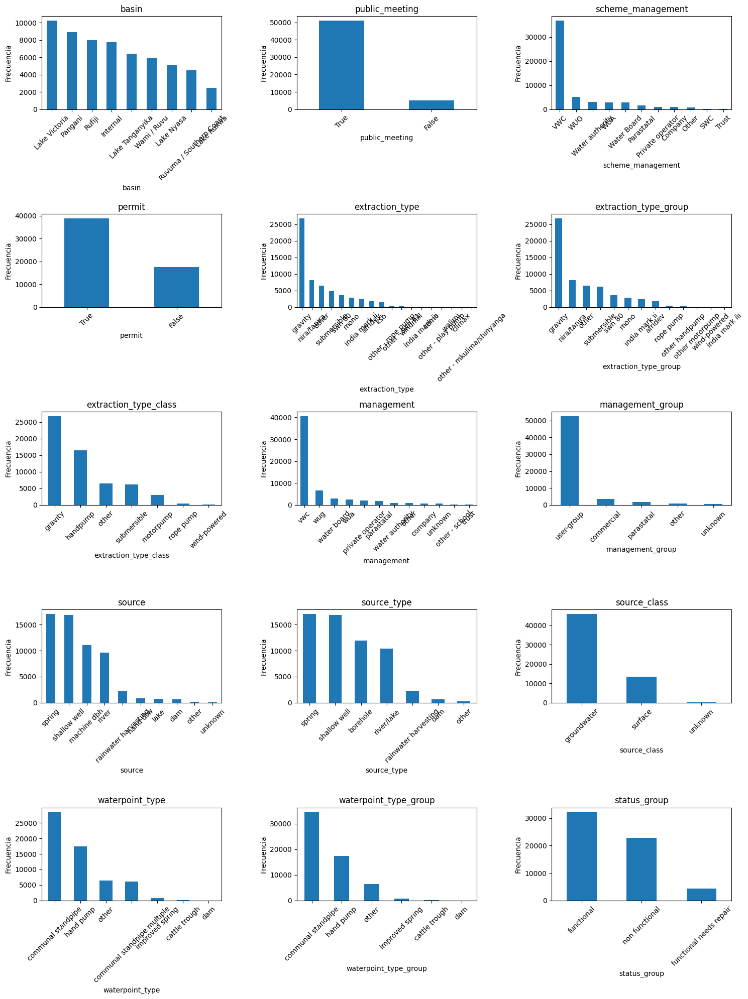

In [24]:
import matplotlib.pyplot as plt

# Visualización de la distribución de variables categóricas con ≤ 20 categorías únicas

cat_vars_to_plot = [col for col in lista_categoricas if df_pump[col].nunique() <= 20]

n_cols = 3
n_rows = (len(cat_vars_to_plot) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axes = axes.flatten() 

for i, col in enumerate(cat_vars_to_plot):
    df_pump[col].value_counts().plot(kind='bar', ax=axes[i])
    axes[i].set_title(f'{col}')
    axes[i].set_ylabel('Frecuencia')
    axes[i].tick_params(axis='x', rotation=45)

# Elimina los ejes vacíos si hay menos variables que subgráficos creados
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


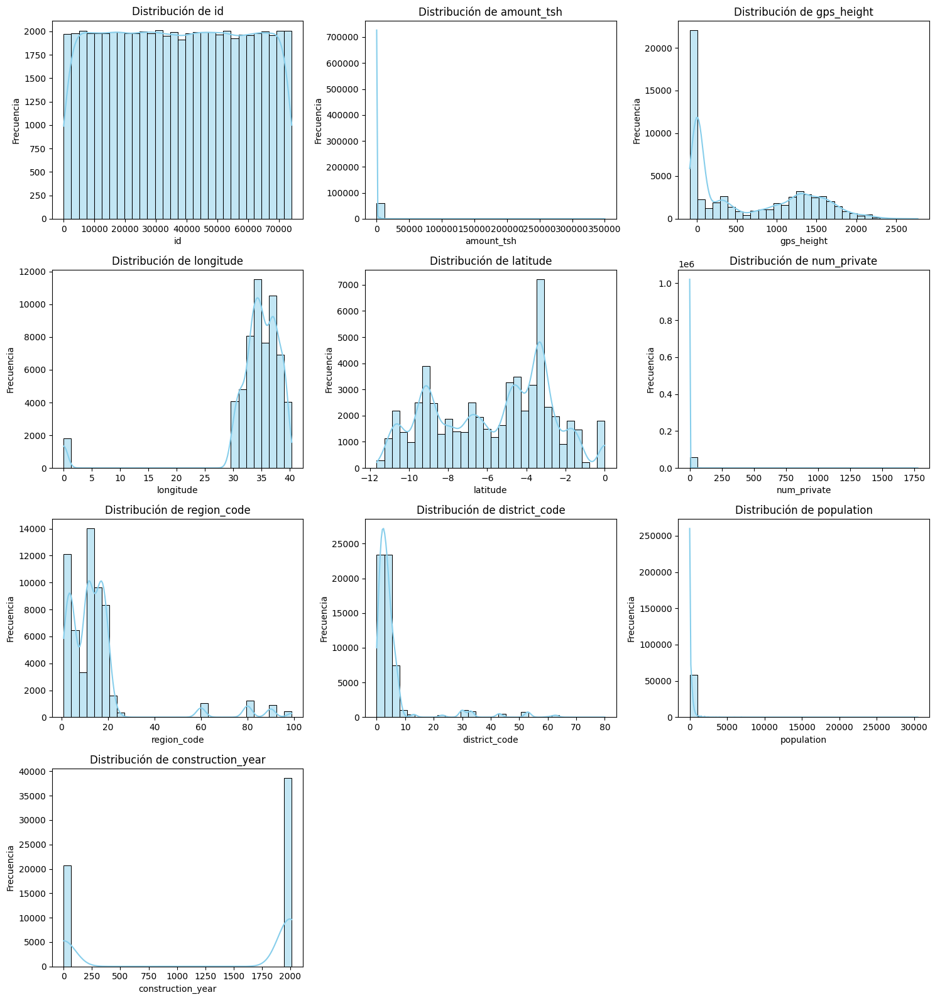

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualización de la distribución de variables numéricas.

num_col_names = df_pump.select_dtypes(exclude=["object", "category"]).columns.tolist()

n_cols = 3
n_rows = (len(num_col_names) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axes = axes.flatten()  

for i, col in enumerate(num_col_names):
    sns.histplot(df_pump[col], bins=30, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Distribución de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [26]:
df_pump.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'status_group'],
      dtype='object')

In [27]:
df_pump.dtypes

id                         int64
amount_tsh               float64
date_recorded             object
funder                    object
gps_height                 int64
installer                 object
longitude                float64
latitude                 float64
wpt_name                  object
num_private                int64
basin                     object
subvillage                object
region                    object
region_code                int64
district_code              int64
lga                       object
ward                      object
population                 int64
public_meeting            object
recorded_by               object
scheme_management         object
scheme_name               object
permit                    object
construction_year          int64
extraction_type           object
extraction_type_group     object
extraction_type_class     object
management                object
management_group          object
payment                   object
payment_ty

#### 2.2.1 recorded_by

In [29]:
df_pump['recorded_by']

0        GeoData Consultants Ltd
1        GeoData Consultants Ltd
2        GeoData Consultants Ltd
3        GeoData Consultants Ltd
4        GeoData Consultants Ltd
                  ...           
59395    GeoData Consultants Ltd
59396    GeoData Consultants Ltd
59397    GeoData Consultants Ltd
59398    GeoData Consultants Ltd
59399    GeoData Consultants Ltd
Name: recorded_by, Length: 59400, dtype: object

#### Todos los valores son mismos, no aporta ningun valor, asi que podemos borrar este registro.

In [31]:
df_pump = df_pump.drop('recorded_by', axis = 1)


#### 2.2.2 date_recorded

- En este apartado se ha trabajado con la variable **date_recorded**.

- Se decidió transformar la variable a formato datetime y posteriormente crear una nueva variable llamada **days_since_recorded**, que representa **el número de días transcurridos** desde la fecha de registro más reciente disponible en el conjunto de datos.

- **La motivación** detrás de esta transformación es que **los pozos registrados más recientemente podrían tener mayor probabilidad de estar funcionales**, en comparación con aquellos cuya información es más antigua.

In [33]:
df_pump['date_recorded']

0        2011-03-14
1        2013-03-06
2        2013-02-25
3        2013-01-28
4        2011-07-13
            ...    
59395    2013-05-03
59396    2011-05-07
59397    2011-04-11
59398    2011-03-08
59399    2011-03-23
Name: date_recorded, Length: 59400, dtype: object

In [34]:
df_pump['date_recorded'] = pd.to_datetime(df_pump['date_recorded'])
df_pump['date_recorded'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 59400 entries, 0 to 59399
Series name: date_recorded
Non-Null Count  Dtype         
--------------  -----         
59400 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 464.2 KB


In [35]:
max(df_pump['date_recorded'])

Timestamp('2013-12-03 00:00:00')

In [36]:
# transformar 'date_recorded' a 'days_since_recorded'

df_pump['date_recorded'] = pd.to_datetime(df_pump['date_recorded'])

# Fecha de referencia (fecha máxima del dataset)
ref_date = pd.to_datetime("2013-12-03")

# Calcular días desde la fecha grabada
df_pump['days_since_recorded'] = (ref_date - df_pump['date_recorded']).dt.days

df_pump['days_since_recorded']

0         995
1         272
2         281
3         309
4         874
         ... 
59395     214
59396     941
59397     967
59398    1001
59399     986
Name: days_since_recorded, Length: 59400, dtype: int64

In [37]:
df_pump.days_since_recorded.describe()

count    59400.000000
mean       613.616970
std        334.216374
min          0.000000
25%        297.000000
50%        419.000000
75%        977.000000
max       4068.000000
Name: days_since_recorded, dtype: float64

In [38]:
df_pump = df_pump.drop('date_recorded', axis = 1)

#### 2.2.3 construction_year

- Se transformó la variable **construction_year** en una columna categórica con las siguientes etiquetas: '60s', '70s', '80s', '90s', '00s', '10s' y 'unknown'.

- Para ello, se dividieron los años en décadas, lo que permite **reducir la granularidad de los datos y facilita la interpretación de patrones** relacionados con la antigüedad de los pozos.

- Los valores nulos o igual a 0 fueron categorizados como 'unknown'

In [40]:
# transformamos a categorias: 
def construction_decade(construction_year):
    if construction_year >= 1960 and construction_year < 1970:
        return '60s'
    elif construction_year >= 1970 and construction_year < 1980:
        return '70s'
    elif construction_year >= 1980 and construction_year < 1990:
        return '80s'
    elif construction_year >= 1990 and construction_year < 2000:
        return '90s'
    elif construction_year >= 2000 and construction_year < 2010:
        return '00s'
    elif construction_year >= 2010:
        return '10s'
    else:
        return 'unknown'

df_pump['construction_decade'] = df_pump.apply(lambda x: construction_decade(x['construction_year']), axis=1)

df_pump['construction_decade']

0            90s
1            10s
2            00s
3            80s
4        unknown
          ...   
59395        90s
59396        90s
59397    unknown
59398    unknown
59399        00s
Name: construction_decade, Length: 59400, dtype: object

#### 2.2.4 population

In [42]:
df_pump['population'].value_counts()

population
0       21381
1        7025
200      1940
150      1892
250      1681
        ...  
6330        1
5030        1
656         1
948         1
788         1
Name: count, Length: 1049, dtype: int64

#### 2.2.5 extraction_type_group, extraction_type, extraction_type_class

- Estas tres variables representan distintos niveles de categorización del tipo de extracción, y es posible que contengan información redundante.

- Se realizó una comparación entre ellas para determinar cuál aporta mayor variedad y riqueza informativa.

- Finalmente, se decidió conservar únicamente la variable **extraction_type**, ya que **contiene un mayor número de categorías** y, por tanto, proporciona más detalle sobre el tipo de extracción. Las otras dos fueron eliminadas por resultar redundantes.

In [44]:
df_pump[['extraction_type_group', 'extraction_type', 'extraction_type_class']]

,extraction_type_group,extraction_type,extraction_type_class
0,gravity,gravity,gravity
1,gravity,gravity,gravity
2,gravity,gravity,gravity
3,submersible,submersible,submersible
4,gravity,gravity,gravity
...,...,...,...
59395,gravity,gravity,gravity
59396,gravity,gravity,gravity
59397,swn 80,swn 80,handpump
59398,nira/tanira,nira/tanira,handpump


In [45]:
df_pump[['extraction_type_group', 'extraction_type', 'extraction_type_class']].isnull().sum()

extraction_type_group    0
extraction_type          0
extraction_type_class    0
dtype: int64

In [46]:
same_rows = (
    (df_pump['extraction_type_group'] == df_pump['extraction_type']) &
    (df_pump['extraction_type_group'] == df_pump['extraction_type_class'])
)

print("Número de filas donde las tres columnas son exactamente iguales:", same_rows.sum())
print("Número total de filas en el dataset:", len(df_pump))


Número de filas donde las tres columnas son exactamente iguales: 37974
Número total de filas en el dataset: 59400


In [47]:
df_pump[['extraction_type_group', 'extraction_type', 'extraction_type_class']].nunique()


extraction_type_group    13
extraction_type          18
extraction_type_class     7
dtype: int64

In [48]:
df_pump = df_pump.drop('extraction_type_group', axis = 1)
df_pump = df_pump.drop('extraction_type_class', axis = 1)


In [49]:
df_pump["extraction_type"].value_counts()

extraction_type
gravity                      26780
nira/tanira                   8154
other                         6430
submersible                   4764
swn 80                        3670
mono                          2865
india mark ii                 2400
afridev                       1770
ksb                           1415
other - rope pump              451
other - swn 81                 229
windmill                       117
india mark iii                  98
cemo                            90
other - play pump               85
walimi                          48
climax                          32
other - mkulima/shinyanga        2
Name: count, dtype: int64

In [50]:

df_pump["extraction_type"] = np.where(
    df_pump["extraction_type"].isin(['gravity', 'nira/tanira', 'submersible', 'swn 80', 'mono', 'india mark ii']),
    df_pump["extraction_type"],
    "other"
)


In [51]:
df_pump['extraction_type'].value_counts()

extraction_type
gravity          26780
other            10767
nira/tanira       8154
submersible       4764
swn 80            3670
mono              2865
india mark ii     2400
Name: count, dtype: int64

#### 2.2.6 payment, payment_type

- Ambas variables describen el método de pago y presentan información **prácticamente idéntica**, diferenciándose únicamente en el nombre de las categorías.

- Tras revisar ambas columnas, se decidió conservar **payment_type** por motivos de simplicidad y consistencia, y eliminar payment por ser redundante.

In [53]:
df_pump[['payment', 'payment_type']]

,payment,payment_type
0,pay annually,annually
1,never pay,never pay
2,pay per bucket,per bucket
3,never pay,never pay
4,never pay,never pay
...,...,...
59395,pay per bucket,per bucket
59396,pay annually,annually
59397,pay monthly,monthly
59398,never pay,never pay


In [54]:
df_pump[['payment', 'payment_type']].isnull().sum()

payment         0
payment_type    0
dtype: int64

In [55]:
df_pump[['payment', 'payment_type']].nunique()


payment         7
payment_type    7
dtype: int64

In [56]:
df_pump[['payment', 'payment_type']].drop_duplicates().sort_values(by='payment')


,payment,payment_type
1,never pay,never pay
12,other,other
0,pay annually,annually
13,pay monthly,monthly
2,pay per bucket,per bucket
11,pay when scheme fails,on failure
7,unknown,unknown


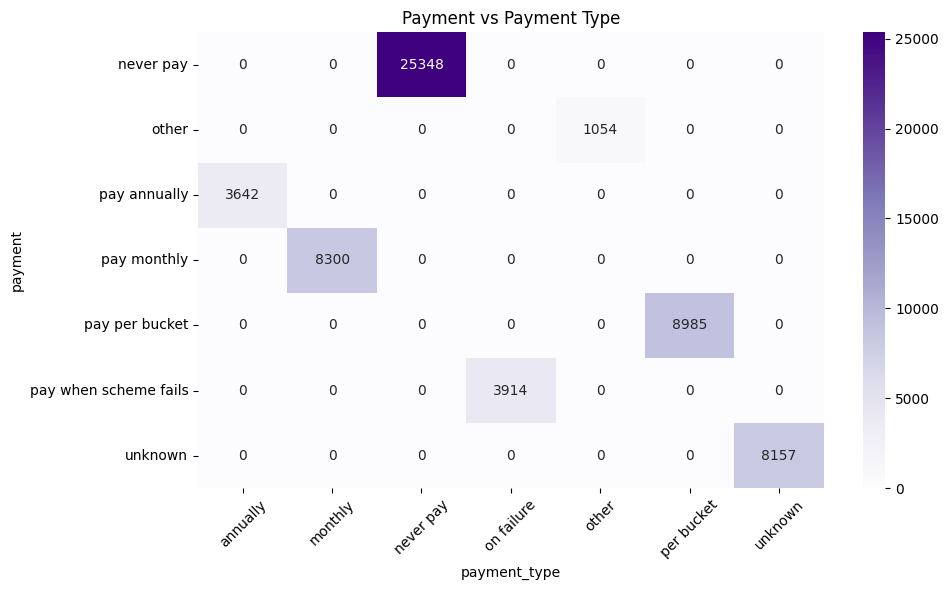

In [57]:
cross_tab_payment = pd.crosstab(df_pump['payment'], df_pump['payment_type'])

plt.figure(figsize=(10, 6))
sns.heatmap(cross_tab_payment, annot=True, fmt='d', cmap="Purples")
plt.title("Payment vs Payment Type")
plt.ylabel("payment")
plt.xlabel("payment_type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [58]:
df_pump = df_pump.drop('payment', axis = 1)

#### 2.2.7 water_quality, quality_group

- Ambas variables describen la calidad del agua. La columna **quality_group** representa una versión simplificada de water_quality, agrupando categorías similares (por ejemplo, 'fluoride' y 'fluoride abandoned' se agrupan como 'fluoride').

- Dado que quality_group ofrece una visión más homogénea y generalizable de la calidad del agua, se ha optado por conservar esta variable

In [60]:
df_pump[['water_quality', 'quality_group']]

,water_quality,quality_group
0,soft,good
1,soft,good
2,soft,good
3,soft,good
4,soft,good
...,...,...
59395,soft,good
59396,soft,good
59397,fluoride,fluoride
59398,soft,good


In [61]:
df_pump[['water_quality', 'quality_group']].isnull().sum()

water_quality    0
quality_group    0
dtype: int64

In [62]:
df_pump[['water_quality', 'quality_group']].nunique()


water_quality    8
quality_group    6
dtype: int64

In [63]:
df_pump[['water_quality', 'quality_group']].drop_duplicates().sort_values(by='water_quality')


,water_quality,quality_group
129,coloured,colored
110,fluoride,fluoride
6793,fluoride abandoned,fluoride
7,milky,milky
5,salty,salty
277,salty abandoned,salty
0,soft,good
21,unknown,unknown


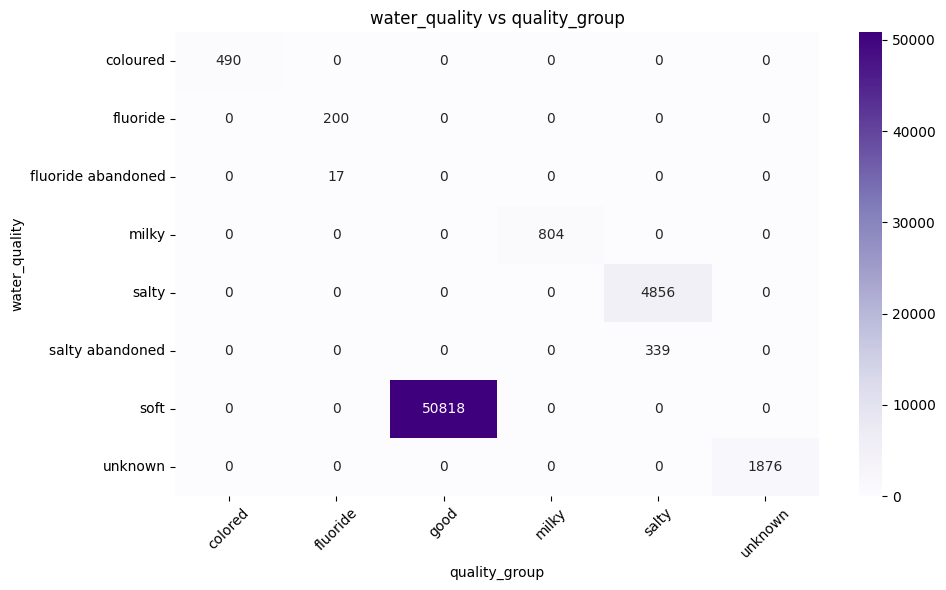

In [64]:
cross_tab_payment = pd.crosstab(df_pump['water_quality'], df_pump['quality_group'])

plt.figure(figsize=(10, 6))
sns.heatmap(cross_tab_payment, annot=True, fmt='d', cmap="Purples")
plt.title("water_quality vs quality_group")
plt.ylabel("water_quality")
plt.xlabel("quality_group")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [65]:
df_pump = df_pump.drop('water_quality', axis = 1)


#### 2.2.8 management, management_group

In [67]:
df_pump[['management', 'management_group']]

,management,management_group
0,vwc,user-group
1,wug,user-group
2,vwc,user-group
3,vwc,user-group
4,other,other
...,...,...
59395,water board,user-group
59396,vwc,user-group
59397,vwc,user-group
59398,vwc,user-group


In [68]:
df_pump[['management', 'management_group']].isnull().sum()

management          0
management_group    0
dtype: int64

In [69]:
df_pump[['management', 'management_group']].drop_duplicates().sort_values(by='management')


,management,management_group
28,company,commercial
4,other,other
636,other - school,other
84,parastatal,parastatal
10,private operator,commercial
1703,trust,commercial
227,unknown,unknown
0,vwc,user-group
50,water authority,commercial
13,water board,user-group


In [70]:
tabla = pd.crosstab(df_pump['management'],df_pump['status_group'])
tabla

status_group,functional,functional needs repair,non functional
management,,,
company,267,15,403
other,505,55,284
other - school,23,1,75
parastatal,1020,211,537
private operator,1476,44,451
trust,46,6,26
unknown,224,27,310
vwc,20425,2791,17291
water authority,446,52,406


In [71]:
tabla = pd.crosstab(df_pump['management_group'],df_pump['status_group'])
tabla

status_group,functional,functional needs repair,non functional
management_group,,,
commercial,2235,117,1286
other,528,56,359
parastatal,1020,211,537
unknown,224,27,310
user-group,28252,3906,20332


In [72]:
df_pump = df_pump.drop('management', axis = 1)


#### 2.2.9 quantity, quantity_group

- Ambas variables representan la cantidad de agua disponible, y como se puede observar, contienen exactamente la misma información.

- Tras revisar ambas columnas, se ha decidido **conservar `quantity`** y eliminar quantity_group, ya que son equivalentes y mantener ambas generaría redundancia innecesaria.


In [74]:
df_pump[['quantity', 'quantity_group']]

,quantity,quantity_group
0,enough,enough
1,insufficient,insufficient
2,enough,enough
3,dry,dry
4,seasonal,seasonal
...,...,...
59395,enough,enough
59396,enough,enough
59397,enough,enough
59398,insufficient,insufficient


In [75]:
df_pump[['quantity', 'quantity_group']].isnull().sum()

quantity          0
quantity_group    0
dtype: int64

In [76]:
df_pump[['quantity', 'quantity_group']].drop_duplicates().sort_values(by='quantity')


,quantity,quantity_group
3,dry,dry
0,enough,enough
1,insufficient,insufficient
4,seasonal,seasonal
21,unknown,unknown


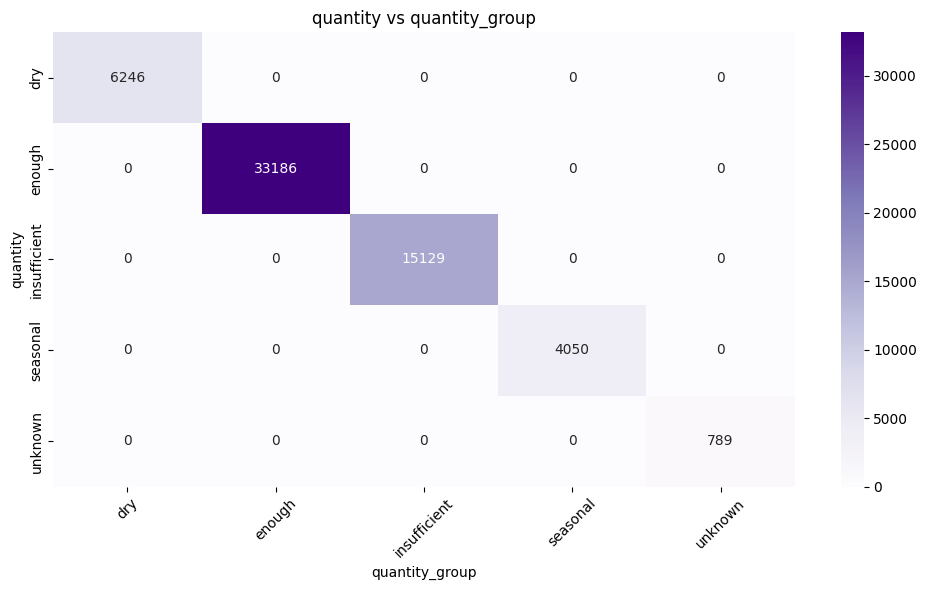

In [77]:
cross_tab_payment = pd.crosstab(df_pump['quantity'], df_pump['quantity_group'])

plt.figure(figsize=(10, 6))
sns.heatmap(cross_tab_payment, annot=True, fmt='d', cmap="Purples")
plt.title("quantity vs quantity_group")
plt.ylabel("quantity")
plt.xlabel("quantity_group")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [78]:
df_pump = df_pump.drop('quantity_group', axis = 1)


#### 2.2.10 scheme_management, scheme_name

- La variable **scheme_name** contiene una alta proporción de valores nulos y un número elevado de categorías, muchas de ellas redundantes o muy similares entre sí.

- **scheme_management**, ofrece una visión más estructurada. Se considera que **scheme_name no aporta valor significativo** al análisis y se ha decidido eliminarla del conjunto de datos.

In [80]:
df_pump[['scheme_management', 'scheme_name']].drop_duplicates().sort_values(by='scheme_name')

,scheme_management,scheme_name
15097,VWC,14 Kambarage
21397,VWC,A
24735,Parastatal,A
4874,Water Board,A
3367,WUA,A
...,...,...
132,WUA,NaN
149,Water Board,NaN
823,Company,NaN
1703,Trust,NaN


In [81]:
df_pump[['scheme_management', 'scheme_name']].isnull().sum()

scheme_management     3878
scheme_name          28810
dtype: int64

In [82]:
df_pump = df_pump.drop('scheme_name', axis = 1)


#### 2.2.11 source, source_type, source_class

- Ambas variables describen el origen del agua, pero se ha observado que source_type es una versión más generalizada de source.

- Cada valor de **source_type** agrupa varios valores de source, lo que indica una fuerte redundancia entre ambas columnas.

- Para reducir la dimensionalidad del dataset sin perder información relevante, se ha decidido conservar **source_type**.

In [84]:
df_pump[['source', 'source_type', 'source_class']]

,source,source_type,source_class
0,spring,spring,groundwater
1,rainwater harvesting,rainwater harvesting,surface
2,dam,dam,surface
3,machine dbh,borehole,groundwater
4,rainwater harvesting,rainwater harvesting,surface
...,...,...,...
59395,spring,spring,groundwater
59396,river,river/lake,surface
59397,machine dbh,borehole,groundwater
59398,shallow well,shallow well,groundwater


In [85]:
df_pump[['source', 'source_type']].isnull().sum()

source         0
source_type    0
dtype: int64

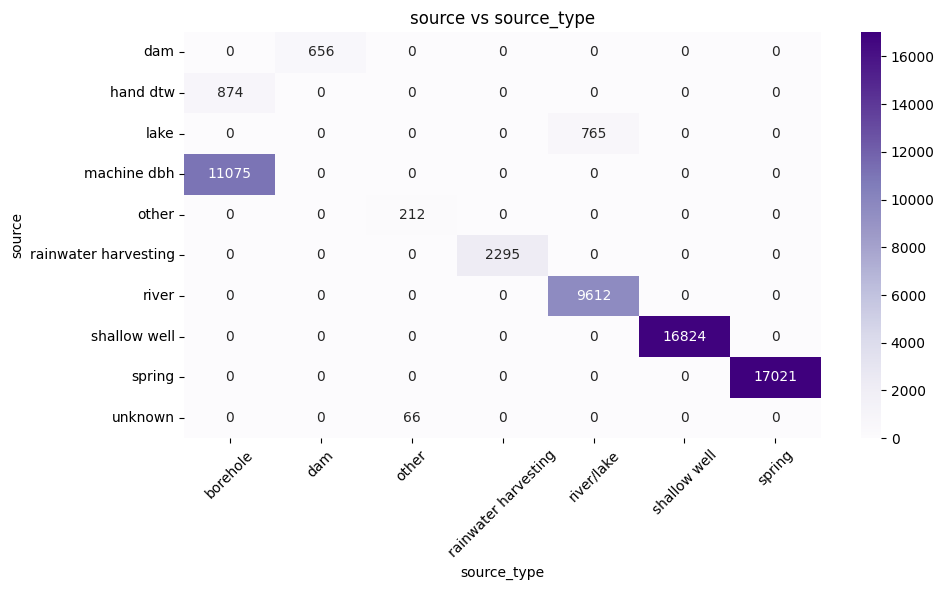

In [86]:
cross_tab_payment = pd.crosstab(df_pump['source'], df_pump['source_type']) #source_class

plt.figure(figsize=(10, 6))
sns.heatmap(cross_tab_payment, annot=True, fmt='d', cmap="Purples")
plt.title("source vs source_type")
plt.ylabel("source")
plt.xlabel("source_type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [87]:
df_pump = df_pump.drop('source', axis = 1)


#### 2.2.12 waterpoint_type, waterpoint_type_group

-Ambas variables describen el tipo de punto de agua, pero **waterpoint_type_group** representa una versión agrupada de waterpoint_type.

- Como se observa en el gráfico, cada categoría de waterpoint_type_group engloba varias categorías específicas de waterpoint_type, por ejemplo:

   - 'communal standpipe' agrupa tanto 'communal standpipe' como 'communal standpipe multiple'

   - 'hand pump' agrupa distintos tipos de bombas de mano

- Dado que **waterpoint_type_group** ofrece una estructura más simplificada y manejable para el análisis, se ha optado por conservar esta variable



In [89]:
df_pump[['waterpoint_type', 'waterpoint_type_group']]

,waterpoint_type,waterpoint_type_group
0,communal standpipe,communal standpipe
1,communal standpipe,communal standpipe
2,communal standpipe multiple,communal standpipe
3,communal standpipe multiple,communal standpipe
4,communal standpipe,communal standpipe
...,...,...
59395,communal standpipe,communal standpipe
59396,communal standpipe,communal standpipe
59397,hand pump,hand pump
59398,hand pump,hand pump


In [90]:
df_pump[['waterpoint_type', 'waterpoint_type_group']].isnull().sum()

waterpoint_type          0
waterpoint_type_group    0
dtype: int64

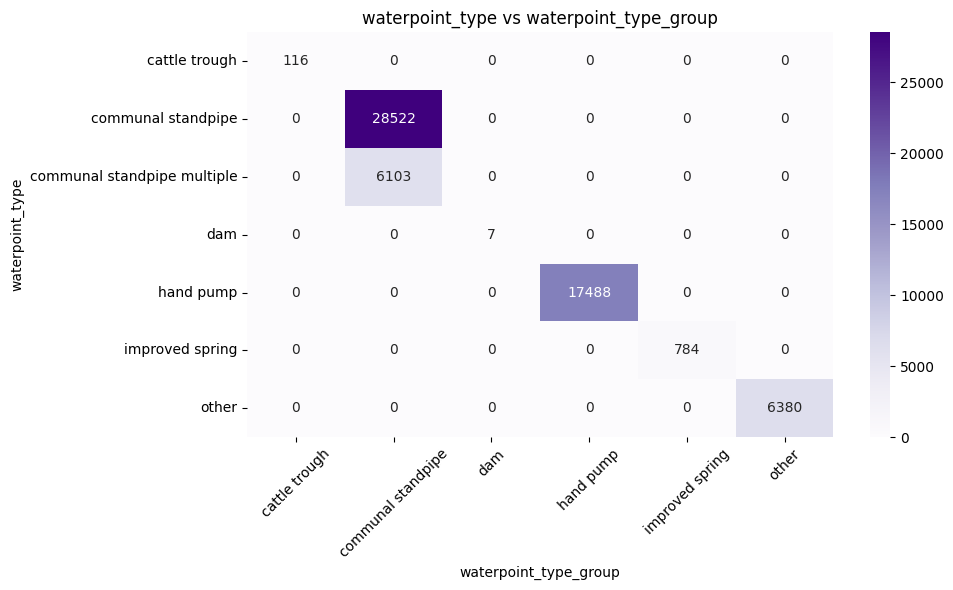

In [91]:
cross_tab_payment = pd.crosstab(df_pump['waterpoint_type'], df_pump['waterpoint_type_group'])

plt.figure(figsize=(10, 6))
sns.heatmap(cross_tab_payment, annot=True, fmt='d', cmap="Purples")
plt.title("waterpoint_type vs waterpoint_type_group")
plt.ylabel("waterpoint_type")
plt.xlabel("waterpoint_type_group")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [92]:
df_pump = df_pump.drop('waterpoint_type', axis = 1)


#### 2.2.13 wpt_name

- La variable wpt_name corresponde al nombre del punto de agua (waterpoint name), **no aporta información útil al modelo predictivo ni contribuye al análisis**.

In [94]:
df_pump = df_pump.drop('wpt_name', axis = 1)

#### 2.3 Missings
- Se realizaron diversas estrategias para tratar los valores nulos o inconsistentes en variables clave del conjunto de datos. A continuación se detallan los principales pasos:

    - ***`funder`***:  Esta variable presentaba una gran cantidad de valores faltantes y categorías dispersas. Se aplicó una función personalizada ** (simplify_funder)** para **agrupar los financiadores más frecuentes y asignar 'other' o 'unknown' a los valores poco representativos o nulos**.
      
    - ***`installer`***: Se normalizó esta columna **transformando el texto a minúsculas y eliminando espacios**. Posteriormente, **se creó un diccionario de mapeo (installer_map) para unificar nombres similares como 'gov', 'gover' y 'government', reduciendo así la cardinalidad**.
 
      
    - ***`public_meeting`***: Esta variable booleana presentaba algunos valores nulos. **Se reemplazaron por 'unknown' para mantener la integridad de la variable sin eliminar registros**.
 
      
    - ***`lga`***: **Se agruparon solo los valores más representativos** de la columna (por ejemplo, 'Njombe', 'Arusha Rural', 'Moshi Rural', etc.), y **el resto se codificó como 'other'**.
 
      
    - ***`region`***: De manera similar a lga, **se conservaron únicamente las regiones con una representación superior al 5%** y **se agruparon las demás bajo la categoría 'other'**.
 
      
    - ***`ward`***: Esta variable **fue eliminada por contener una gran cantidad de valores únicos (alta cardinalidad)**, muchos de ellos poco informativos o sin relevancia para el modelo.
 
      
 
    - ***`scheme_management`***: Se normalizó el texto para eliminar inconsistencias en los nombres. Luego se aplicó una función simplify_scheme para agrupar las categorías más frecuentes ('vwc', 'wug', 'water authority', etc.) y codificar el resto como 'other'. Esto *permitió reducir la alta cardinalidad* de esta variable sin perder información relevante.
 
      
 
    - ***`permit`***: Al igual que public_meeting, **los valores nulos fueron reemplazados por 'unknown'**.
 
      
 
    - ***`subvillage`***: Se identificó que esta variable contenía **19.287 valores únicos**, no aporta valor predictivo. Por ello, se decidió eliminarla para reducir complejidad.
 

 
    - ***`region_code`***: Se detectó que esta columna **tenía códigos distintos para una misma región** (inconsistencias), por lo que se optó por eliminarla para evitar redundancia, ya que region ya está incluida y normalizada.





In [96]:
df_pump.isnull().sum()

id                          0
amount_tsh                  0
funder                   3637
gps_height                  0
installer                3655
longitude                   0
latitude                    0
num_private                 0
basin                       0
subvillage                371
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting           3334
scheme_management        3878
permit                   3056
construction_year           0
extraction_type             0
management_group            0
payment_type                0
quality_group               0
quantity                    0
source_type                 0
source_class                0
waterpoint_type_group       0
status_group                0
days_since_recorded         0
construction_decade         0
dtype: int64

### 2.3.1 funder

In [98]:
df_pump['funder'].value_counts()


funder
Government Of Tanzania    9084
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
                          ... 
Muwasa                       1
Msigw                        1
Rc Mofu                      1
Overland High School         1
Samlo                        1
Name: count, Length: 1896, dtype: int64

In [99]:
df_pump['funder'].value_counts(dropna=False).head(10)


funder
Government Of Tanzania    9084
NaN                       3637
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
Kkkt                      1287
World Vision              1246
Unicef                    1057
Tasaf                      877
Name: count, dtype: int64

In [100]:
def simplify_funder(funder):
    if funder == 'Government Of Tanzania':
        return 'gov'
    elif funder == 'Danida':
        return 'danida'
    elif funder == 'Hesawa':
        return 'hesawa'
    elif funder == 'Rwssp':
        return 'rwssp'
    elif pd.isna(funder):
        return 'unknown'
    else:
        return 'other'

df_pump['funder'] = df_pump['funder'].apply(simplify_funder)


In [101]:
df_pump['funder'] 

0          other
1          other
2          other
3          other
4          other
          ...   
59395      other
59396      other
59397    unknown
59398      other
59399      other
Name: funder, Length: 59400, dtype: object

In [102]:
tabla = pd.crosstab(df_pump['funder'],df_pump['status_group'])
tabla

status_group,functional,functional needs repair,non functional
funder,,,
danida,1713,159,1242
gov,3720,701,4663
hesawa,936,232,1034
other,23103,2679,14207
rwssp,805,109,460
unknown,1982,437,1218


### 2.3.2 lga

In [104]:
df_pump['lga'].value_counts().head(10)

#ward
#lga

lga
Njombe          2503
Arusha Rural    1252
Moshi Rural     1251
Bariadi         1177
Rungwe          1106
Kilosa          1094
Kasulu          1047
Mbozi           1034
Meru            1009
Bagamoyo         997
Name: count, dtype: int64

In [105]:
df_pump["lga"] = np.where(
    df_pump["lga"].isin(['Njombe', 'Arusha Rural', 'Moshi Rural', 'Bariadi', 'Rungwe', 'Kilosa', 'Kasulu', 'Mbozi']),
    df_pump["lga"],
    "other"
)

df_pump['lga'].value_counts()

lga
other           48936
Njombe           2503
Arusha Rural     1252
Moshi Rural      1251
Bariadi          1177
Rungwe           1106
Kilosa           1094
Kasulu           1047
Mbozi            1034
Name: count, dtype: int64

### 2.3.3 ward

In [107]:
df_pump['ward'].value_counts()

ward
Igosi              307
Imalinyi           252
Siha Kati          232
Mdandu             231
Nduruma            217
                  ... 
Uchindile            1
Thawi                1
Uwanja wa Ndege      1
Izia                 1
Kinungu              1
Name: count, Length: 2092, dtype: int64

In [108]:
df_pump = df_pump.drop('ward', axis = 1)

### 2.3.4 region

In [110]:

df_pump["region"].value_counts(normalize=True)


region
Iringa           0.089125
Shinyanga        0.083872
Mbeya            0.078098
Kilimanjaro      0.073721
Morogoro         0.067441
Arusha           0.056397
Kagera           0.055825
Mwanza           0.052222
Kigoma           0.047407
Ruvuma           0.044444
Pwani            0.044360
Tanga            0.042879
Dodoma           0.037054
Singida          0.035236
Mara             0.033148
Tabora           0.032980
Rukwa            0.030438
Mtwara           0.029125
Manyara          0.026650
Lindi            0.026027
Dar es Salaam    0.013552
Name: proportion, dtype: float64

In [111]:
list(df_pump["region"].value_counts()[df_pump["region"].value_counts(normalize=True)> 0.05].index)


['Iringa',
 'Shinyanga',
 'Mbeya',
 'Kilimanjaro',
 'Morogoro',
 'Arusha',
 'Kagera',
 'Mwanza']

In [112]:
import numpy as np

df_pump["region"] = np.where(
    df_pump["region"].isin(['Iringa', 'Shinyanga', 'Mbeya', 'Kilimanjaro', 'Morogoro', 'Arusha', 'Kagera', 'Mwanza']),
    df_pump["region"],
    "other"
)

df_pump['region'].value_counts()

region
other          26332
Iringa          5294
Shinyanga       4982
Mbeya           4639
Kilimanjaro     4379
Morogoro        4006
Arusha          3350
Kagera          3316
Mwanza          3102
Name: count, dtype: int64

In [113]:
df_pump['region'].value_counts()

region
other          26332
Iringa          5294
Shinyanga       4982
Mbeya           4639
Kilimanjaro     4379
Morogoro        4006
Arusha          3350
Kagera          3316
Mwanza          3102
Name: count, dtype: int64

### 2.3.5 installer

In [115]:
df_pump.installer.value_counts().head(30)

installer
DWE                   17402
Government             1825
RWE                    1206
Commu                  1060
DANIDA                 1050
KKKT                    898
Hesawa                  840
0                       777
TCRS                    707
Central government      622
CES                     610
Community               553
DANID                   552
District Council        551
HESAWA                  539
LGA                     408
World vision            408
WEDECO                  397
TASAF                   396
District council        392
Gover                   383
AMREF                   329
TWESA                   316
WU                      301
Dmdd                    287
ACRA                    278
World Vision            270
SEMA                    249
DW                      246
OXFAM                   234
Name: count, dtype: int64

In [116]:
df_pump['installer'] = df_pump['installer'].str.lower()

installer = df_pump.groupby('installer')['id'].count().reset_index()
installer = installer.sort_values('id', ascending = False)
installer.head(20)

,installer,id
385,dwe,17405
511,government,1891
583,hesawa,1395
1446,rwe,1206
261,commu,1065
311,danida,1050
360,district council,961
800,kkkt,910
1,0,777
206,central government,763


In [117]:
#transformamos nombres similares  

df_pump['installer'] = df_pump['installer'].str.strip().str.lower()

installer_map = {
    'government': 'government',
    'gover': 'government',
    'gov': 'government',
    'central government': 'government',
    'danida': 'danida',
    'daniad': 'danida',
    'commu': 'community',
    'community': 'community',
}

df_pump['installer'] = df_pump['installer'].replace(installer_map)
df_pump['installer'].value_counts().head(20)

installer
dwe                 17405
government           3165
community            1620
hesawa               1395
rwe                  1206
danida               1051
district council      961
kkkt                  910
0                     777
tcrs                  707
world vision          699
danid                 624
ces                   610
amref                 443
lga                   413
tasaf                 411
wedeco                398
fini water            389
dmdd                  376
norad                 360
Name: count, dtype: int64

In [118]:
def simplify_installer(installer):
    if installer == 'dwe':
        return 'dwe'
    elif installer == 'government':
        return 'government'
    elif installer == 'community':
        return 'community'
    elif installer == 'hesawa':
        return 'hesawa'
    elif installer == 'rwe':
        return 'rwe'
    else:
        return 'other'

df_pump['installer'] = df_pump['installer'].apply(simplify_installer)
df_pump['installer'].value_counts()

installer
other         34609
dwe           17405
government     3165
community      1620
hesawa         1395
rwe            1206
Name: count, dtype: int64

In [119]:
df_pump['installer'].isnull().sum()

0

In [120]:
tabla = pd.crosstab(df_pump['installer'],df_pump['status_group'])
tabla

status_group,functional,functional needs repair,non functional
installer,,,
community,1113,73,434
dwe,9434,1622,6349
government,993,304,1868
hesawa,786,54,555
other,19629,2127,12853
rwe,304,137,765


### 2.3.6 public_meeting

In [122]:
df_pump['public_meeting'].value_counts()

public_meeting
True     51011
False     5055
Name: count, dtype: int64

In [123]:
df_pump['public_meeting'].isnull().sum()

3334

In [124]:
df_pump['public_meeting'] = df_pump['public_meeting'].fillna('unknown')

In [125]:
tabla = pd.crosstab(df_pump['public_meeting'],df_pump['status_group'])
tabla

status_group,functional,functional needs repair,non functional
public_meeting,,,
False,2173,442,2440
True,28408,3719,18884
unknown,1678,156,1500


In [126]:
df_pump['public_meeting'].isnull().sum()

0

### 2.3.7 scheme_management 

In [128]:
df_pump['scheme_management'].isnull().sum()

3878

In [129]:
df_pump['scheme_management'].value_counts()

scheme_management
VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
Name: count, dtype: int64

In [130]:
df_pump['scheme_management'] = df_pump['scheme_management'].str.strip().str.lower()
df_pump['scheme_management'].value_counts()

scheme_management
vwc                 36793
wug                  5206
water authority      3153
wua                  2883
water board          2748
parastatal           1680
private operator     1063
company              1061
other                 766
swc                    97
trust                  72
Name: count, dtype: int64

In [131]:
def simplify_scheme(scheme_management):
    if scheme_management == 'vwc':
        return 'vwc'
    elif scheme_management == 'wug':
        return 'wug'
    elif scheme_management == 'water authority':
        return 'wtr_authority'
    elif scheme_management == 'wua':
        return 'wua'
    elif scheme_management == 'water board ':
        return 'wtr_board'
    else:
        return 'other'

df_pump['scheme_management'] = df_pump['scheme_management'].apply(simplify_scheme)
df_pump['scheme_management'].value_counts()

scheme_management
vwc              36793
other            11365
wug               5206
wtr_authority     3153
wua               2883
Name: count, dtype: int64

In [132]:
tabla = pd.crosstab(df_pump['scheme_management'],df_pump['status_group'])
tabla

status_group,functional,functional needs repair,non functional
scheme_management,,,
other,6680,624,4061
vwc,18960,2334,15499
wtr_authority,1618,448,1087
wua,1995,239,649
wug,3006,672,1528


In [133]:
df_pump['scheme_management'].isnull().sum()

0

### 2.3.8 permit 

In [135]:
df_pump['permit'].isnull().sum()

3056

In [136]:
df_pump['permit'].value_counts()

permit
True     38852
False    17492
Name: count, dtype: int64

In [137]:
df_pump['permit'] = df_pump['permit'].fillna('unknown')

df_pump['permit'].isnull().sum()

0

### 2.3.9 subvillage 

In [139]:
df_pump['subvillage']

0            Mnyusi B
1             Nyamara
2             Majengo
3          Mahakamani
4          Kyanyamisa
             ...     
59395        Kiduruni
59396        Igumbilo
59397       Madungulu
59398          Mwinyi
59399    Kikatanyemba
Name: subvillage, Length: 59400, dtype: object

In [140]:
df_pump['subvillage'].value_counts().head(10)

subvillage
Madukani    508
Shuleni     506
Majengo     502
Kati        373
Mtakuja     262
Sokoni      232
M           187
Muungano    172
Mbuyuni     164
Mlimani     152
Name: count, dtype: int64

In [141]:
df_pump['subvillage'].nunique()

19287

too many nunique values in this variable, so we can delete this

In [143]:
df_pump = df_pump.drop('subvillage', axis = 1)


In [144]:

df_pump = df_pump.drop('region_code', axis = 1)

In [145]:
df_pump.isnull().sum()

id                       0
amount_tsh               0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
num_private              0
basin                    0
region                   0
district_code            0
lga                      0
population               0
public_meeting           0
scheme_management        0
permit                   0
construction_year        0
extraction_type          0
management_group         0
payment_type             0
quality_group            0
quantity                 0
source_type              0
source_class             0
waterpoint_type_group    0
status_group             0
days_since_recorded      0
construction_decade      0
dtype: int64

In [146]:
# df_pump.to_csv('dataser_cleaned.csv')


### 3.1  Transformación de variables numéricas 

- ***amount_tsh***: Se transformó en una variable categórica llamada tsh_group, agrupando los valores de cantidad de agua (en litros) en rangos:
    - '0', '1–500', '500–2000', '2000–10000', '10000+'. Esto facilita el análisis y modelado, ya que la variable presentaba una alta dispersión.


- ***gps_height***: Esta variable representa la altitud sobre el nivel del mar. **Se identificaron valores negativos o inconsistentes, que fueron reemplazados por NaN y luego imputados con la mediana por región**. También se creó una nueva variable categórica llamada **gps_height_group**, que agrupa los valores en rangos interpretables: '0', '0–500', '500–1000', '1000–1500', '1500–2000', '2000–3000', '3000+'

- ***num_private***: Esta variable no aportaba información útil (mayoría de los valores eran ceros), por lo que se decidió eliminarla del conjunto de datos.

- ***district_code***: Se convirtió a tipo cadena (string) para tratarla como variable categórica. Luego se agruparon los códigos menos frecuentes bajo la etiqueta 'other', conservando solo los códigos '1' a '7'.

- ***population***: Se transformó en la variable categórica **population_group**, dividiendo la población estimada en los siguientes rangos:

    '0', '1–50', '51–200', '201–1000', '1001–5000', '5000+'

    **Esta transformación permite tratar los valores extremos y mejorar la interpretación de la variable.**


- ***days_since_recorded***: Esta variable fue agrupada en rangos mediante la nueva variable days_recorded_group, con etiquetas: '0–200', '200–499', '500–699', '700–999', '1000+'

In [148]:
df_pump.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,district_code,population,construction_year,days_since_recorded
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,5.629747,179.909983,1300.652475,613.616970
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,9.633649,471.482176,951.620547,334.216374
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,0.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,2.000000,0.000000,0.000000,297.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,3.000000,25.000000,1986.000000,419.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,5.000000,215.000000,2004.000000,977.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,80.000000,30500.000000,2013.000000,4068.000000


In [149]:
df_pump.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   funder                 59400 non-null  object 
 3   gps_height             59400 non-null  int64  
 4   installer              59400 non-null  object 
 5   longitude              59400 non-null  float64
 6   latitude               59400 non-null  float64
 7   num_private            59400 non-null  int64  
 8   basin                  59400 non-null  object 
 9   region                 59400 non-null  object 
 10  district_code          59400 non-null  int64  
 11  lga                    59400 non-null  object 
 12  population             59400 non-null  int64  
 13  public_meeting         59400 non-null  object 
 14  scheme_management      59400 non-null  object 
 15  pe

#### 3.1.1 variables categoricas 

In [151]:
# primero transmormamos variables categoricas 

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

df_pump['funder'] = le.fit_transform(df_pump['funder'])
df_pump['installer'] = le.fit_transform(df_pump['installer'])
df_pump['basin'] = le.fit_transform(df_pump['basin'])
df_pump['public_meeting'] = le.fit_transform(df_pump['public_meeting'].astype(str))
df_pump['public_meeting'] = le.fit_transform(df_pump['public_meeting'])
df_pump['permit'] = le.fit_transform(df_pump['permit'].astype(str))
df_pump['permit'] = le.fit_transform(df_pump['permit'])
df_pump['scheme_management'] = le.fit_transform(df_pump['scheme_management'])
df_pump['payment_type'] = le.fit_transform(df_pump['payment_type'])
df_pump['management_group'] = le.fit_transform(df_pump['management_group'])
df_pump['quality_group'] = le.fit_transform(df_pump['quality_group'])
df_pump['quantity'] = le.fit_transform(df_pump['quantity'])
df_pump['source_type'] = le.fit_transform(df_pump['source_type'])
df_pump['source_class'] = le.fit_transform(df_pump['source_class'])
df_pump['waterpoint_type_group'] = le.fit_transform(df_pump['waterpoint_type_group'])
df_pump['construction_decade'] = le.fit_transform(df_pump['construction_decade'])
df_pump['region'] = le.fit_transform(df_pump['region'])
df_pump['extraction_type'] = le.fit_transform(df_pump['extraction_type'])
df_pump['lga'] = le.fit_transform(df_pump['lga'])


#### 3.2Feature Engineering

In [153]:
df_pump['amount_tsh'] = df_pump['amount_tsh'].astype(int)
df_pump['amount_tsh'].value_counts()

amount_tsh
0         41643
500        3102
50         2472
1000       1488
20         1463
          ...  
8500          1
6300          1
350000        1
138000        1
59            1
Name: count, Length: 96, dtype: int64

In [154]:
df_pump['amount_tsh'].describe()


count     59400.00000
mean        317.65037
std        2997.57456
min           0.00000
25%           0.00000
50%           0.00000
75%          20.00000
max      350000.00000
Name: amount_tsh, dtype: float64

In [155]:
df_pump['amount_tsh'].sort_values(ascending=False).head(10)


10812    350000
22191    250000
22817    200000
45067    170000
9961     138000
9917     120000
10615    117000
54595    117000
5558     117000
37459    117000
Name: amount_tsh, dtype: int64

In [156]:
import plotly.express as px

fig = px.histogram(df_pump, x='amount_tsh', nbins=50, title='Distribución de amount_tsh')
fig.show()


In [157]:
from scipy.stats.mstats import winsorize

# Aplicar winsorize al 5% en cada extremo
# limits=(0.05, 0.05) significa 5% inferior y 5% superior
from scipy.stats.mstats import winsorize

df_pump['amount_tsh_winsor'] = winsorize(df_pump['amount_tsh'], limits=(0.01, 0.01))

fig = px.histogram(df_pump, x='amount_tsh_winsor', nbins=50, title='Distribución de amount_tsh_winsor')
fig.show()

#df_pump['amount_tsh_log'] = np.log1p(df_pump['amount_tsh'])


In [158]:
#agrupar amount_tsh_winsor
df_pump['tsh_group'] = pd.cut(df_pump['amount_tsh'],
                               bins=[-1, 0, 500, 2000, 10000, np.inf],
                               labels=['0', '1–500', '500–2000', '2000–10000', '10000+'])



In [159]:
fig = px.histogram(df_pump, x='tsh_group', nbins=50, title='Distribución de tsh_group')
fig.show()

In [160]:
df_pump = df_pump.drop(['amount_tsh'],axis=1)
df_pump = df_pump.drop(['amount_tsh_winsor'],axis=1)


In [161]:
#gps_height
df_pump['gps_height'].value_counts()

gps_height
 0       20438
-15         60
-16         55
-13         55
 1290       52
         ...  
 2378        1
-54          1
 2057        1
 2332        1
 2366        1
Name: count, Length: 2428, dtype: int64

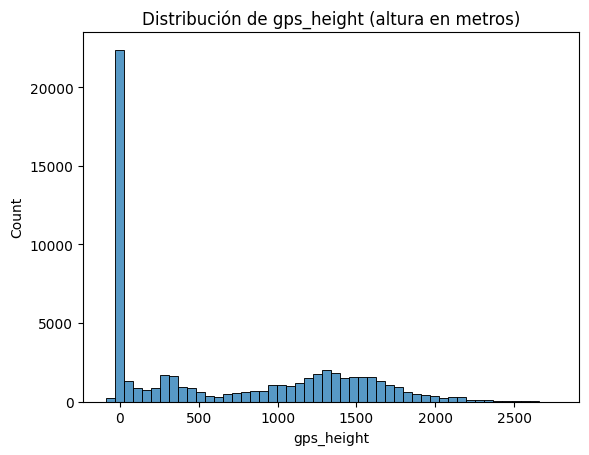

In [162]:
sns.histplot(df_pump['gps_height'], bins=50)
plt.title("Distribución de gps_height (altura en metros)")
plt.show()

In [163]:
df_pump['gps_height'].describe()

#filtrar:
df_pump[df_pump['gps_height'] < 0]


,id,funder,gps_height,installer,longitude,latitude,num_private,basin,region,district_code,...,payment_type,quality_group,quantity,source_type,source_class,waterpoint_type_group,status_group,days_since_recorded,construction_decade,tsh_group
34,41583,5,-41,4,39.812912,-7.889986,0,6,8,63,...,2,4,1,5,0,3,functional,1014,6,0
152,60983,3,-15,4,39.527114,-6.988748,0,8,8,3,...,2,4,0,0,0,5,non functional,262,3,0
181,68908,5,-21,4,39.670943,-7.906606,0,6,8,60,...,2,2,1,0,0,1,functional,1004,6,0
184,2136,5,-16,4,39.854320,-7.783063,0,6,8,63,...,2,4,1,5,0,3,functional,1015,6,0
249,35193,3,-19,4,39.244178,-7.368293,0,6,8,4,...,2,2,0,5,0,3,non functional,993,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59200,20017,3,-3,4,40.160806,-10.578354,0,7,8,1,...,6,2,1,0,0,1,functional,298,1,0
59243,3396,3,-20,4,39.524021,-6.984802,0,8,8,3,...,5,2,1,5,0,3,functional,262,1,1–500
59251,65997,3,-37,4,39.736299,-9.884813,0,7,8,62,...,6,2,2,6,0,1,functional,313,4,0
59351,55322,3,-19,4,39.534599,-7.088183,0,8,8,3,...,5,2,1,0,0,1,functional,260,0,1–500


**`gps_height`** representa la elevación sobre el nivel del mar (en metros). Por lo tanto, el valor mínimo lógico es 0.

In [165]:
tabla = pd.crosstab(df_pump['gps_height'], df_pump['status_group'])
tabla

status_group,functional,functional needs repair,non functional
gps_height,,,
-90,1,0,0
-63,2,0,0
-59,0,0,1
-57,1,0,0
-55,0,0,1
...,...,...,...
2623,1,0,0
2626,2,0,0
2627,0,0,1


In [166]:
#reemplazarlo con valor mediana agrupando por regiones

df_pump.loc[df_pump['gps_height'] < 0, 'gps_height'] = np.nan
df_pump['gps_height'] = df_pump.groupby('region')['gps_height'].transform(
    lambda x: x.fillna(x.median())
)

df_pump['gps_height'].describe()

count    59400.000000
mean       688.948923
std        684.459925
min          0.000000
25%          0.000000
50%        465.000000
75%       1319.250000
max       2770.000000
Name: gps_height, dtype: float64

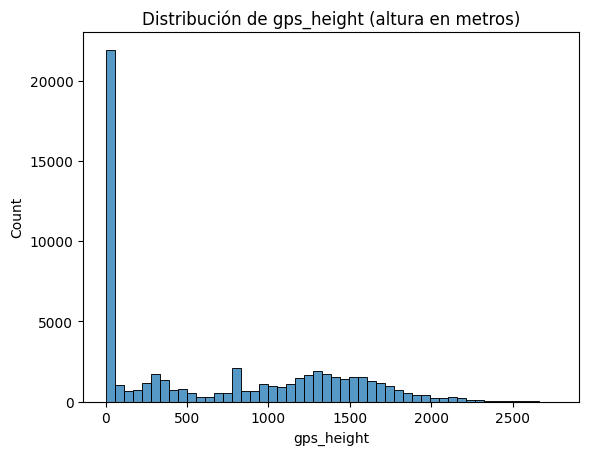

In [167]:
sns.histplot(df_pump['gps_height'], bins=50)
plt.title("Distribución de gps_height (altura en metros)")
plt.show()

In [168]:
df_pump['gps_height'] = pd.to_numeric(df_pump['gps_height'], errors='coerce')

# Agrupar gps_height en rangos
df_pump['gps_height_group'] = pd.cut(df_pump['gps_height'],
    bins=[-1, 0, 500, 1000, 1500, 2000, 3000, 10000],
    labels=['0', '0–500', '500–1000', '1000–1500', '1500–2000', '2000–3000', '3000+'])
df_pump['gps_height_group'].value_counts()

gps_height_group
0            20438
1000–1500    12827
0–500         9749
1500–2000     8447
500–1000      6717
2000–3000     1222
3000+            0
Name: count, dtype: int64

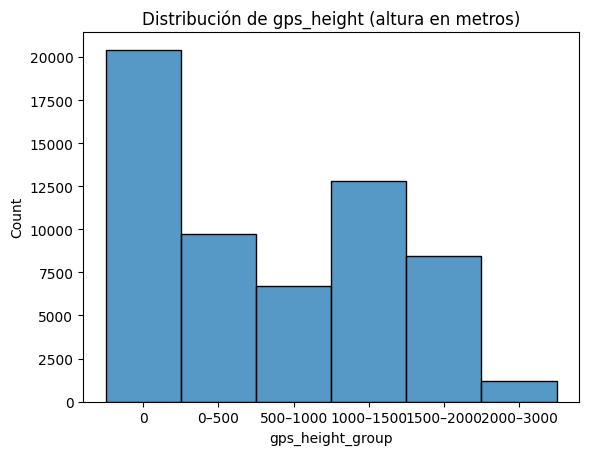

In [169]:
sns.histplot(df_pump['gps_height_group'], bins=50)
plt.title("Distribución de gps_height (altura en metros)")
plt.show()


In [170]:
df_pump = df_pump.drop('num_private', axis=1)

In [171]:
df_pump['district_code'].value_counts()


district_code
1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: count, dtype: int64

In [172]:
df_pump["district_code"] = df_pump["district_code"].astype(str)

df_pump["district_code"] = np.where(
    df_pump["district_code"].isin(["1", "2", "3", "4", "5", "6", "7"]),
    df_pump["district_code"],
    "other"
)

df_pump["district_code"].value_counts()

district_code
1        12203
2        11173
3         9998
4         8999
other     5254
5         4356
6         4074
7         3343
Name: count, dtype: int64

In [173]:
#population

df_pump['population'].value_counts()

population
0       21381
1        7025
200      1940
150      1892
250      1681
        ...  
6330        1
5030        1
656         1
948         1
788         1
Name: count, Length: 1049, dtype: int64

In [174]:
tabla = pd.crosstab(df_pump['population'],df_pump['status_group'])
tabla
                

status_group,functional,functional needs repair,non functional
population,,,
0,11274,1775,8332
1,2911,354,3760
2,3,0,1
3,3,0,1
4,9,0,4
...,...,...,...
9865,0,0,1
10000,3,0,0
11463,1,0,0


In [175]:
df_pump['population_group'] = pd.cut(df_pump['population'],
    bins=[-1, 0, 50, 200, 1000, 5000, np.inf],
    labels=['0', '1–50', '51–200', '201–1000', '1001–5000', '5000+']
)

df_pump['population_group']

0          51–200
1        201–1000
2        201–1000
3          51–200
4               0
           ...   
59395      51–200
59396      51–200
59397           0
59398           0
59399      51–200
Name: population_group, Length: 59400, dtype: category
Categories (6, object): ['0' < '1–50' < '51–200' < '201–1000' < '1001–5000' < '5000+']

In [176]:
df_pump = df_pump.drop('population', axis=1)

In [177]:
df_pump = df_pump.drop('construction_year', axis=1)

In [178]:
#days_since_recorded
df_pump['days_since_recorded'].value_counts()

days_since_recorded
994    572
992    558
303    546
995    520
993    513
      ... 
814      1
825      1
804      1
826      1
2        1
Name: count, Length: 356, dtype: int64

In [179]:
fig = px.histogram(df_pump, x='days_since_recorded', nbins=50, title='Distribución de days_since_recorded')
fig.show()


In [180]:
df_pump['days_recorded_group'] = pd.cut(
    df_pump['days_since_recorded'],
    bins=[-1, 200, 499, 699, 999, np.inf],
    labels=['0–200', '200–499', '500–699', '700–999', '1000+']
)

df_pump['days_recorded_group'].value_counts()

days_recorded_group
200–499    29061
700–999    22602
1000+       6103
0–200       1632
500–699        2
Name: count, dtype: int64

Longitud

In [182]:
df_pump = df_pump.drop('days_since_recorded', axis=1)

In [183]:
df_pump = df_pump.drop('gps_height', axis=1)

In [184]:
# Se decidió conservar las variables 'longitude' y 'latitude', 
#ya que el modelo mostró un mejor rendimiento cuando se incluyeron en el entrenamiento.

#df_pump = df_pump.drop('longitude', axis=1)
#df_pump = df_pump.drop('latitude', axis=1)

In [185]:

df_pump['tsh_group'] = le.fit_transform(df_pump['tsh_group'])
df_pump['gps_height_group'] = le.fit_transform(df_pump['gps_height_group'])
df_pump['district_code'] = le.fit_transform(df_pump['district_code'])
df_pump['population_group'] = le.fit_transform(df_pump['population_group'])
df_pump['days_recorded_group'] = le.fit_transform(df_pump['days_recorded_group'])


In [186]:
df_pump.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   funder                 59400 non-null  int64  
 2   installer              59400 non-null  int64  
 3   longitude              59400 non-null  float64
 4   latitude               59400 non-null  float64
 5   basin                  59400 non-null  int64  
 6   region                 59400 non-null  int64  
 7   district_code          59400 non-null  int64  
 8   lga                    59400 non-null  int64  
 9   public_meeting         59400 non-null  int64  
 10  scheme_management      59400 non-null  int64  
 11  permit                 59400 non-null  int64  
 12  extraction_type        59400 non-null  int64  
 13  management_group       59400 non-null  int64  
 14  payment_type           59400 non-null  int64  
 15  qu

In [187]:
df_pump['status_group'].replace(('functional','non functional','functional needs repair'),
                          (0,1,2),inplace=True)


/var/folders/36/2kz5x__n3x38j68p_ny9bjb40000gn/T/ipykernel_73857/2248476543.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/var/folders/36/2kz5x__n3x38j68p_ny9bjb40000gn/T/ipykernel_73857/2248476543.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [188]:
df_pump['status_group'].value_counts()

status_group
0    32259
1    22824
2     4317
Name: count, dtype: int64

In [189]:
df_pump['status_group'].value_counts(normalize=True)

status_group
0    0.543081
1    0.384242
2    0.072677
Name: proportion, dtype: float64

### 4.1 Modelling
#### 4.1.1 train test split

In [191]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df_pump.drop('status_group',axis=1),
                                                    df_pump.status_group,
                                                    test_size=0.2,
                                                    random_state=42)

### 4.1.2 RandomForestClassifier

In [193]:
#modelo 1 RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

model1 = RandomForestClassifier()

In [194]:
model1.fit(X_train,y_train)
y_pred = model1.predict(X_test)

In [195]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.88      0.84      6457
           1       0.83      0.77      0.80      4572
           2       0.49      0.33      0.40       851

    accuracy                           0.80     11880
   macro avg       0.71      0.66      0.68     11880
weighted avg       0.79      0.80      0.79     11880



In [196]:
def plot_feature_importance(model, X_train):
    feat_importances = pd.DataFrame(model.feature_importances_, index=X_train.columns, columns=["Importance"])
    feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
    
    fig = px.bar(feat_importances, x=feat_importances.index, y='Importance', title='Feature Importances', labels={'x': 'Features', 'Importance': 'Importance'}, template='plotly_white')
    fig.show()

    return feat_importances

In [197]:
plot_feature_importance(model1, X_train)

,Importance
longitude,0.152876
latitude,0.147714
quantity,0.132896
id,0.116568
waterpoint_type_group,0.060271
extraction_type,0.036815
construction_decade,0.034328
payment_type,0.029183
district_code,0.025208
source_type,0.023946


In [198]:
lista_final = [
 'longitude',
 'latitude',
 'quantity',
 'waterpoint_type_group',
 'construction_decade',
 'district_code',
 'payment_type',
 'extraction_type',
 'basin',
 'population_group',
 'gps_height_group',
 'source_type',
 'region',
 'installer',
 'scheme_management',
 'tsh_group',
 'quality_group',
 'permit',
 'days_recorded_group',
 'public_meeting']

In [199]:
#model_rfc_2 con variables lista_final

model_rfc_2 = RandomForestClassifier().fit(X_train[lista_final],y_train)
y_pred = model_rfc_2.predict(X_test[lista_final])

In [200]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      6457
           1       0.82      0.78      0.80      4572
           2       0.49      0.36      0.42       851

    accuracy                           0.80     11880
   macro avg       0.70      0.67      0.68     11880
weighted avg       0.79      0.80      0.79     11880



In [201]:
from sklearn.model_selection import cross_val_score

#Aplicar validación cruzada con 5 particiones y calcula el F1-macro para evaluar el modelo:
scores = cross_val_score(model_rfc_2, X_train[lista_final], y_train, 
                         cv=5, scoring='f1_macro')

In [202]:
print("F1 macro por fold:", scores)
print("F1 macro promedio:", scores.mean())

F1 macro por fold: [0.66271287 0.68230107 0.67699584 0.67103275 0.67419835]
F1 macro promedio: 0.6734481766279625


In [203]:
#modelo RandomForestClassifier con class_weight='balanced'

model_rfc_balaced = RandomForestClassifier(class_weight='balanced', random_state=42)

In [204]:
model_rfc_balaced.fit(X_train[lista_final],y_train)
y_pred = model_rfc_balaced.predict(X_test[lista_final])

In [205]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      6457
           1       0.83      0.78      0.80      4572
           2       0.48      0.37      0.42       851

    accuracy                           0.80     11880
   macro avg       0.70      0.67      0.68     11880
weighted avg       0.79      0.80      0.79     11880



#### 4.1.3 Logistic Regression


In [207]:
from sklearn.linear_model import LogisticRegression

model_lr = LogisticRegression(
    multi_class='multinomial', 
    solver='lbfgs', 
    max_iter=1000, 
    class_weight='balanced'
)
model_lr.fit(X_train[lista_final], y_train)


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



LogisticRegression(class_weight='balanced', max_iter=1000,
                   multi_class='multinomial')

In [208]:
from sklearn.metrics import classification_report

y_pred = model_lr.predict(X_test[lista_final])


In [209]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.43      0.53      6457
           1       0.58      0.58      0.58      4572
           2       0.14      0.56      0.23       851

    accuracy                           0.50     11880
   macro avg       0.48      0.53      0.45     11880
weighted avg       0.62      0.50      0.53     11880



#### 4.1.3 DecisionTreeClassifier

In [211]:
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier

modelo_clf = DecisionTreeClassifier(random_state=42)
modelo_clf.fit(X_train[lista_final], y_train)

DecisionTreeClassifier(random_state=42)

In [212]:
y_pred = modelo_clf.predict(X_test[lista_final])

In [213]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80      6457
           1       0.77      0.76      0.77      4572
           2       0.36      0.38      0.37       851

    accuracy                           0.76     11880
   macro avg       0.64      0.65      0.65     11880
weighted avg       0.76      0.76      0.76     11880



#### 4.1.4 XGBClassifier

In [215]:
from xgboost import XGBClassifier

model_XGB = XGBClassifier(random_state=42, eval_metric='logloss')

model_XGB.fit(X_train[lista_final], y_train)
y_pred = model_XGB.predict(X_test[lista_final])



In [216]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.78      0.90      0.83      6457
           1       0.83      0.73      0.78      4572
           2       0.61      0.27      0.38       851

    accuracy                           0.79     11880
   macro avg       0.74      0.64      0.66     11880
weighted avg       0.79      0.79      0.78     11880



In [217]:
!pip install xgboost catboost


#### 4.1.5 Comparacion entre diferentes modelos

In [220]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

from xgboost import XGBClassifier
from catboost import CatBoostClassifier

#definir los modelos
models=[LogisticRegression(max_iter = 1000000,  random_state=42),
        KNeighborsClassifier(),
        DecisionTreeClassifier( random_state=42),
       RandomForestClassifier( random_state=42),
       XGBClassifier( random_state=42),
        BaggingClassifier( random_state=42), 
        GradientBoostingClassifier( random_state=42),
       CatBoostClassifier( random_state=42)]

#nombre de los modelos
names =['Logistic Regression', 'KNN Classifier', 'Decision Tree Classifier', 'Random Forest Classifier',  'XGB Classifier', 'Bagging Classifier', 'Gradient Boosting Classifier', 'Catboost Classifier']

#Crear listas vacías para la precisión y la desviación estándar
accuracy=[]
std = []

#“Hacer validación cruzada (10-fold) y guardar los resultados en la lista.
for model in models:
  cv = KFold(n_splits=10, shuffle = True,  random_state=1)
  n_scores = cross_val_score(model, X_train[lista_final], y_train, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
  mean_score = np.mean(n_scores)
  std_score = np.std(n_scores)
  accuracy.append(mean_score)
  std.append(std_score)

#Crear un DataFrame con los resultados.
d = {'Model':names,'Accuracy':accuracy, 'Std':std}   
score_df = pd.DataFrame(d)
score_df

751:	learn: 0.4646163	total: 6.41s	remaining: 2.11s
752:	learn: 0.4645117	total: 6.42s	remaining: 2.11s
753:	learn: 0.4644411	total: 6.43s	remaining: 2.1s
754:	learn: 0.4643803	total: 6.44s	remaining: 2.09s
755:	learn: 0.4643227	total: 6.45s	remaining: 2.08s
756:	learn: 0.4642824	total: 6.45s	remaining: 2.07s
757:	learn: 0.4642048	total: 6.46s	remaining: 2.06s
758:	learn: 0.4640843	total: 6.47s	remaining: 2.05s
759:	learn: 0.4639677	total: 6.48s	remaining: 2.04s
760:	learn: 0.4638561	total: 6.49s	remaining: 2.04s
761:	learn: 0.4638054	total: 6.5s	remaining: 2.03s
762:	learn: 0.4637518	total: 6.5s	remaining: 2.02s
763:	learn: 0.4636792	total: 6.51s	remaining: 2.01s
764:	learn: 0.4635911	total: 6.52s	remaining: 2s
765:	learn: 0.4635150	total: 6.53s	remaining: 1.99s
766:	learn: 0.4634398	total: 6.54s	remaining: 1.99s
767:	learn: 0.4633476	total: 6.55s	remaining: 1.98s
768:	learn: 0.4632941	total: 6.56s	remaining: 1.97s
769:	learn: 0.4632085	total: 6.57s	remaining: 1.96s
770:	learn: 0.4631

,Model,Accuracy,Std
0,Logistic Regression,0.629651,0.005975
1,KNN Classifier,0.756587,0.003570
2,Decision Tree Classifier,0.752757,0.003804
3,Random Forest Classifier,0.795181,0.002483
4,XGB Classifier,0.790930,0.003934
5,Bagging Classifier,0.785627,0.002937
6,Gradient Boosting Classifier,0.744066,0.004535
7,Catboost Classifier,0.789057,0.004552


### 4.2 Mejora de Modelos
Se ha seleccionado el modelo **Random Forest Classifier** para la tarea de predicción, debido a su buen rendimiento con datos heterogéneos y su capacidad para manejar variables categóricas y numéricas sin necesidad de una transformación compleja.
#### 4.2.1 hiperparametros

In [223]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)




In [225]:
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(class_weight='balanced', random_state=42),
    param_grid=param_grid,
    scoring='f1_macro', 
    cv=cv,
    n_jobs=-1,           
    verbose=1
)

grid_search.fit(X_train[lista_final], y_train)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
821:	learn: 0.4589955	total: 9.33s	remaining: 2.02s
822:	learn: 0.4589194	total: 9.34s	remaining: 2.01s
823:	learn: 0.4588463	total: 9.35s	remaining: 2s
824:	learn: 0.4587981	total: 9.35s	remaining: 1.98s
825:	learn: 0.4586992	total: 9.37s	remaining: 1.97s
826:	learn: 0.4586281	total: 9.37s	remaining: 1.96s
827:	learn: 0.4585435	total: 9.38s	remaining: 1.95s
828:	learn: 0.4584790	total: 9.39s	remaining: 1.94s
829:	learn: 0.4584081	total: 9.4s	remaining: 1.93s
830:	learn: 0.4583479	total: 9.41s	remaining: 1.91s
831:	learn: 0.4582506	total: 9.42s	remaining: 1.9s
832:	learn: 0.4581199	total: 9.43s	remaining: 1.89s
833:	learn: 0.4580518	total: 9.44s	remaining: 1.88s
834:	learn: 0.4580063	total: 9.44s	remaining: 1.86s
835:	learn: 0.4579045	total: 9.45s	remaining: 1.85s
836:	learn: 0.4578652	total: 9.46s	remaining: 1.84s
837:	learn: 0.4577937	total: 9.47s	remaining: 1.83s
838:	learn: 0.4577244	total: 9.48s	remaining: 1.82s
839:	le

/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



707:	learn: 0.4697695	total: 7.86s	remaining: 3.24s
708:	learn: 0.4696960	total: 7.87s	remaining: 3.23s
709:	learn: 0.4696459	total: 7.88s	remaining: 3.22s
710:	learn: 0.4695599	total: 7.89s	remaining: 3.21s
711:	learn: 0.4694509	total: 7.9s	remaining: 3.2s
712:	learn: 0.4693899	total: 7.91s	remaining: 3.18s
713:	learn: 0.4693069	total: 7.92s	remaining: 3.17s
714:	learn: 0.4692286	total: 7.93s	remaining: 3.16s
715:	learn: 0.4691602	total: 7.94s	remaining: 3.15s
716:	learn: 0.4690632	total: 7.95s	remaining: 3.14s
717:	learn: 0.4690008	total: 7.96s	remaining: 3.13s
718:	learn: 0.4689043	total: 7.97s	remaining: 3.11s
719:	learn: 0.4687893	total: 7.98s	remaining: 3.1s
720:	learn: 0.4687175	total: 7.99s	remaining: 3.09s
721:	learn: 0.4685522	total: 8s	remaining: 3.08s
722:	learn: 0.4684684	total: 8.01s	remaining: 3.07s
723:	learn: 0.4683427	total: 8.02s	remaining: 3.06s
724:	learn: 0.4683083	total: 8.02s	remaining: 3.04s
725:	learn: 0.4682428	total: 8.03s	remaining: 3.03s
726:	learn: 0.4681

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, None],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200]},
             scoring='f1_macro', verbose=1)

In [227]:
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor puntuación:", grid_search.best_score_)

Mejores parámetros: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Mejor puntuación: 0.6917221729445544


In [229]:
# Entrenamiento del modelo con los primeros hiperparámetros obtenidos tras la primera limpieza del dataset

best_model_1 = RandomForestClassifier(
    max_depth=20,
    min_samples_leaf=1,
    min_samples_split=5,
    n_estimators=200,
    random_state=42
)

# Entrenamiento del modelo
best_model_1.fit(X_train[lista_final], y_train)

# Predicción sobre el conjunto de prueba
y_pred = best_model_1.predict(X_test[lista_final])

# Evaluación del modelo con métricas de clasificación
print(classification_report(y_test, y_pred))

#Esta versión obtuvo la mejor puntuación: 80.98

              precision    recall  f1-score   support

           0       0.79      0.90      0.85      6457
           1       0.85      0.76      0.80      4572
           2       0.57      0.28      0.38       851

    accuracy                           0.80     11880
   macro avg       0.74      0.65      0.68     11880
weighted avg       0.80      0.80      0.80     11880



In [231]:
# Entrenamiento del modelo con un segundo conjunto de hiperparámetros (ajuste más profundo del árbol)

best_model_2 = RandomForestClassifier(
    max_depth=None,
    min_samples_leaf=2,
    min_samples_split=2,
    n_estimators=200,
    random_state=42)

best_model_2.fit(X_train[lista_final], y_train)

y_pred = best_model_2.predict(X_test[lista_final])

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.80      0.90      0.85      6457
           1       0.85      0.77      0.81      4572
           2       0.56      0.30      0.39       851

    accuracy                           0.81     11880
   macro avg       0.74      0.66      0.68     11880
weighted avg       0.80      0.81      0.80     11880



#### Observación:
Aunque este modelo obtuvo un mejor rendimiento en el conjunto de entrenamiento, su desempeño en el conjunto de prueba fue inferior al del modelo anterior (best_model_1), lo que sugiere un posible sobreajuste (overfitting).

In [233]:
# Entrenamiento del modelo con el segundo conjunto de parámetros + ajuste de pesos con class_weight='balanced'
# Esta configuración intenta compensar posibles desbalances en la variable objetivo,
#asignando automáticamente pesos inversamente proporcionales a la frecuencia de las clases.


best_model = RandomForestClassifier(
    max_depth=None,
    min_samples_leaf=2,
    min_samples_split=2,
    n_estimators=200,
    random_state=42,
class_weight='balanced')

best_model.fit(X_train[lista_final], y_train)

y_pred = best_model.predict(X_test[lista_final])

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83      6457
           1       0.84      0.78      0.81      4572
           2       0.38      0.52      0.44       851

    accuracy                           0.79     11880
   macro avg       0.68      0.71      0.69     11880
weighted avg       0.80      0.79      0.79     11880



#### 4.2.2 balanceo de datos 

In [235]:
df_pump['status_group'].value_counts()

status_group
0    32259
1    22824
2     4317
Name: count, dtype: int64

In [237]:
from imblearn.over_sampling import SMOTE

#Definir la estrategia de muestreo: aumentar la clase 2 al 80% de 32259
sampling_strategy = {2: int(32259 * 0.8)}  

# Crear el objeto SMOTE con la estrategia definida
sm = SMOTE(sampling_strategy=sampling_strategy, random_state=42)
X_train_res, y_train_res = sm.fit_resample(X_train[lista_final], y_train) #Aplicar SMOTE para generar datos sintéticos y balancear las clases


from collections import Counter
#la distribución de clases después de aplicar SMOTE
print("After SMOTE:", Counter(y_train_res))

After SMOTE: Counter({2: 25807, 0: 25802, 1: 18252})


In [239]:
#final_model = RandomForestClassifier(random_state=42)

from sklearn.metrics import confusion_matrix


best_model_1.fit(X_train_res, y_train_res)
y_pred = best_model_1.predict(X_test[lista_final])

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[5215  426  816]
 [ 881 3333  358]
 [ 253   86  512]]
              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6457
           1       0.87      0.73      0.79      4572
           2       0.30      0.60      0.40       851

    accuracy                           0.76     11880
   macro avg       0.66      0.71      0.67     11880
weighted avg       0.80      0.76      0.78     11880



#### Observacion: La aplicación de SMOTE en este caso no aporta una mejora significativa al rendimiento del modelo

modelo_final_elegido = RandomForestClassifier(
    max_depth=20,
    min_samples_leaf=1,
    min_samples_split=5,
    n_estimators=200,
    random_state=42
)